**Author:** Heike Müller <br>
**Copyright:** 2022 <br>
**License:** MIT

# Biogeochemical Parameters Oxygen and Chlorophyll of the Baltic Sea

## <a id='content'></a> Table of contents

 - [1. Introduction](#intro)
 - [2. Explore the Data]( #data)
 - [3. Dissolved Oxygen](#diss_oxy)
     - [3.1 Dissolved Oxygen of the Baltic Sea for one date](#diss_oxy_date)
     - [3.2 Dissolved Oxygen of the Baltic Sea for a serie of dates](#diss_oxy_sdate)
     - [3.3 Dissolved Oxygen of the Baltic Sea for a serie of depths](#diss_oxy_sdepth)
 - [4. Chlorophyll](#chloro)
     - [4.1 Chlorophyll of the Baltic Sea for one date](#chloro_date)
     - [4.2 Chlorophyll of the Baltic Sea for a serie of dates](#chloro_sdate)
 - [5. Chlorophyll-Oxygen-Relation at the coast from the Bay of Kiel to the Bay of Pomeranian](#oxy_chl_rel)


## <a id='intro'></a>1. Introduction
[Go back to the "Table of contents"](#content)

This notebook is dedicated to the Baltic Sea.  
The Baltic Sea is suffering by eutrophication.  
One main reason is the mass of nutrients from the agriculture ending in the Baltic Sea through the rivers.  
The consequence is the increase of phytoplankton biomass and the *Chlorophyll a (chl a)* concentration.  
*Chlorophyll a* is an important indicator of water quality.  

In relation to this environmental problem is the *Oxygen depletion*, in particular in deeper layers.  
The consequences are in worst case 'dead zones', where no life is possible.

The aims of this notebook are
- to visualize the *Dissolved Oxygen concentration* and the *Chlorophyll a concentration* over a time period.
- to show you the programming techniques to access the WEkEO data, work with the data and programm the visualization.



## Learning outcomes
- How to access the data from the WEkEO-Platform.
- How to create maps of one product for one date.
- How to creats  maps for a serie of dates.
- How to create maps on a regional zoom. 
- How to create subplots. 
- How to create maps for 2 parameters with subplots.
- How to use functions and loops in Python.


## <a id='data'></a>2. Explore the Data
[Go back to the "Table of contents"](#content)

This notebook is using the Baltic Sea Biogeochemistry Reanalysis model.  
We are downloading the montly means data of the biogeochemical parameters **Dissolved Oxygen (o2)** and the **Chlorophyll (chl)**.  <br>
The time period used in this notebook is from 2016-01-16 to 2020-12-01.  
The depths used in this notebook are from 0-93 m.

&emsp; **Product Description**

&emsp; Baltic Sea Biogeochemistry Reanalysis

&emsp; **Product ID**

&emsp; EO:MO:DAT:BALTICSEA_REANALYSIS_BIO_003_012:dataset-reanalysis-scobi-monthlymeans

&emsp; **Product Links**

&emsp; [BALTICSEA_REANALYSIS_BIO_003_012](https://resources.marine.copernicus.eu/product-detail/BALTICSEA_REANALYSIS_BIO_003_012/INFORMATION)

&emsp; [WEkEO Data](https://www.wekeo.eu/data?view=dataset&dataset=EO%3AMO%3ADAT%3ABALTICSEA_REANALYSIS_BIO_003_012)

&emsp; **Temporal Resolution**

&emsp; Monthly Means

&emsp; **Downloaded Time Period**  
&emsp; from 2016-01-16 to 2020-12-01

&emsp; **Downloaded Depths**  
&emsp; 0-93 m

&emsp; **Variables used**

&emsp; o2:  Mole concentration of dissolved molecular oxygen in sea water mmol/m3  
&emsp; chl: Mass concentration of chlorophyll a in sea water mg/m3



# Import required Python libraries


| Module name | Description |
| :--- | :---|
| **[NumPy](https://numpy.org/)** | *NumPy* is a library for scientific computing with Python. It provides a multidimensional array object and functions for working with these arrays. |
| **[xarray](http://xarray.pydata.org/en/stable/)** | *xarray* is a library for working with labelled multi-dimensional arrays. It introduces labels in the form of dimensions, coordinates and attributes on top of raw NumPy-like arrays. |
| **[Matplotlib](https://matplotlib.org/)** | *Matplotlib* is the basic plotting library for creating static, animated and interactive visualization. |
| **[Cartopy](https://scitools.org.uk/cartopy/docs/latest/)** | *Cartopy* is a library for processing geospatial data, geospatial data analyses and producing geospatial maps. |
| **[Panda](https://pandas.pydata.org/)** | *Panda* is a library for data analsyis and manipulation. |
| **[os](https://docs.python.org/3/library/os.html)** | *os* is a library, that gives us access on operating system functionality. For example: path manipulation. |
|  **[glob](https://docs.python.org/3/library/glob.html)**| *glob* is a library, that allows us to discover files/pathnames matching a specified pattern. |
| **[warnings](https://docs.python.org/3/library/warnings.html)** | *warnings* is a library to manage warnings. |
| **[datetime](https://docs.python.org/3/library/datetime.html)** | *datetime* is a library for manipulating dates and times. |



In [1]:
# To avoid warning messages
import warnings
warnings.filterwarnings('ignore')

# Import libraries
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import glob
import datetime
import os

#### Install the WEkEO HDA client

The [WEkEO HDA client](https://www.wekeo.eu/docs/hda-python-lib) is a python based library. 


In [ ]:
pip install -U hda

### <a id='wekeo_hda_auth'></a>Configure the WEkEO API Authentication

You need to create a configuration file in your root directory with your WEkEO Login data.

- Go to your home directory (not the work directory)
- Click File -> New -> Text File

Copy the following data:

- Fill in your WEkEO Login data 
- Click: File -> Save File As -> .hdarc
- Move the file .hdarc to /home/jovyan :
    - Start a terminal in the home directory.
    - If you enter *ls -a* you can see the file in the directory.
    - Enter the following comand line: *cp .hdarc /home/jovyan*

After ending the WEkEo JupyterLab session, the .hdarc file ist deleted from /home/jovyan.
The next command copies it back.
You have to fill in your user name.

In [ ]:
os.system('cp /home/username/.hdarc /home/jovyan')

### <a id='wekeo_hda_auth'></a>Get the WEkEO API Request

- Open [WEkEO DATA](https://www.wekeo.eu/data)
- CLick on **+** to add a layer
- Select the data set *Baltic SEa Biogeochemistry Reananlysis* in the Cataloque:

<center>
    <img src="img/API_Request0.png" width="700">
</center>

- Click *Add to map...*  
- Select *Mole concentratoin of dissolved molecular oxygen in sea water* and click *Add to map*.

<center>
    <img src="img/API_Request1.png" width="600">
</center>

- Enter the longitude, lattitude, start date, end date, the start depth and the end depth.
- Klick on *Show API request*.

<center>
    <img src="img/API_Request2.png" width="600">
</center>

Here you can copy the API request,
It is already in the code of this notebook

- We are downloading the Parameter **dissolved oxygen** and **chlorophyll a**.
- You saw already the API-Request for the dissolved oxygen.
- To download the chlorophyll a data, it is the same procedure besides you have to select *Mass concentration of chlorophyll a om sea water* in the second picture.
- So, we have two API Requests and 2 downloading processes.
- To download both parameter in one step, we have to change the API Request manually. We are not doing this here.

## Change the download path

In this notebook, we are changing the working directory for the download.  
This is, because there were sometimes problems when the downloaded data were moved in another directory by the os-module.  
After the download is finished and the datasets are opened, we will change the working directory back.

In [2]:
# Get the working directory
os.getcwd()

'/home/hmueller1/CopernicusData'

In [3]:
# Change the working directory to the Folder \Data
os.chdir('Data')

# Get the new working directory
data_dir = os.getcwd()

# show data_dir
data_dir

'/home/hmueller1/CopernicusData/Data'

# Download the data

The download of data from WEkEO ist limited to 1 GB.  
If you need more, you have to split it.

In the next two cells you see the queries of the API Requests for **Dissolved Oxygen** and **Chlorophyll a**.

In [6]:
data_o2 = {
  "datasetId": "EO:MO:DAT:BALTICSEA_REANALYSIS_BIO_003_012:dataset-reanalysis-scobi-monthlymeans",
  "boundingBoxValues": [
    {
      "name": "bbox",
      "bbox": [
        8,
        53,
        31,
        66
      ]
    }
  ],
  "dateRangeSelectValues": [
    {
      "name": "position",
      "start": "2016-01-16T00:00:00.000Z",
      "end": "2020-12-01T00:00:00.000Z"
    }
  ],
  "multiStringSelectValues": [
    {
      "name": "variable",
      "value": [
        "o2"
      ]
    }
  ],
  "stringChoiceValues": [
    {
      "name": "service",
      "value": "BALTICSEA_REANALYSIS_BIO_003_012-TDS"
    },
    {
      "name": "product",
      "value": "dataset-reanalysis-scobi-monthlymeans"
    },
    {
      "name": "startDepth",
      "value": "1.5013654232025146"
    },
    {
      "name": "endDepth",
      "value": "93.28632354736328"
    }
  ]
}

In [7]:
data_chl = {
  "datasetId": "EO:MO:DAT:BALTICSEA_REANALYSIS_BIO_003_012:dataset-reanalysis-scobi-monthlymeans",
  "boundingBoxValues": [
    {
      "name": "bbox",
      "bbox": [
        8,
        53,
        31,
        66
      ]
    }
  ],
  "dateRangeSelectValues": [
    {
      "name": "position",
      "start": "2016-01-16T00:00:00.000Z",
      "end": "2020-12-01T00:00:00.000Z"
    }
  ],
  "multiStringSelectValues": [
    {
      "name": "variable",
      "value": [
        "chl"
      ]
    }
  ],
  "stringChoiceValues": [
    {
      "name": "service",
      "value": "BALTICSEA_REANALYSIS_BIO_003_012-TDS"
    },
    {
      "name": "product",
      "value": "dataset-reanalysis-scobi-monthlymeans"
    },
    {
      "name": "startDepth",
      "value": "1.5013654232025146"
    },
    {
      "name": "endDepth",
      "value": "93.28632354736328"
    }
  ]
}

In [8]:
# The following line imports the HDA python library
# We need this to download the data

from hda import Client
c = Client(debug=True)


ModuleNotFoundError: No module named 'hda'

In [ ]:
# Download the Dissolved Oxygen data

matches = c.search(data_o2)
print(matches)
matches.download()

In [ ]:
# Download the Chlorophyll data

matches = c.search(data_chl)
print(matches)
matches.download()

In [4]:
# Read in the downloaded nc-files sorted in descending order 
# data_dir is the Data-Directory

files = [file for file in os.listdir(data_dir) if (file.lower().endswith('.nc'))]
files_list = []

for file in sorted(files,key=os.path.getmtime):
    files_list.append(file)

In [5]:
# Print the downloaded files

files_list

['dataset-reanalysis-scobi-monthlymeans_1658565390466.nc',
 'dataset-reanalysis-scobi-monthlymeans_1658567051791.nc']

In [6]:
# Length of files_list
# This is the number of downloaded files

length = len(files_list)
length

2

In [7]:
# Open the o2-Dataset

data_baltic_o2=xr.open_dataset(files_list[0])

# Show dat_baltic_o2 
# Check, if there is a data variable o2
data_baltic_o2

<xarray.Dataset>
Dimensions:    (time: 60, depth: 21, latitude: 523, longitude: 383)
Coordinates:
  * depth      (depth) float32 1.501 4.513 7.54 10.58 ... 66.58 72.31 78.61
  * latitude   (latitude) float32 48.49 48.53 48.56 48.59 ... 65.82 65.86 65.89
  * time       (time) datetime64[ns] 2016-01-16T12:00:00 ... 2020-12-16T12:00:00
  * longitude  (longitude) float32 9.014 9.069 9.125 9.18 ... 30.12 30.18 30.24
Data variables:
    o2         (time, depth, latitude, longitude) float32 ...
Attributes: (12/24)
    references:                                 http://www.smhi.se
    institution:                                Swedish Meterological and Hyd...
    history:                                    See source and creation_date ...
    Conventions:                                CF-1.5
    contact:                                    servicedesk_cmems@mercator-oc...
    comment:                                    Provided by SMHI as a Coperni...
    ...                                         ...
    bullentin_date:                             20201201
    start_date:                                 2020-12-01 UTC
    stop_date:                                  2020-12-01 UTC
    start_time:                                 00:00 UTC
    stop_time:                                  00:00 UTC
    _CoordSysBuilder:                           ucar.nc2.dataset.conv.CF1Conv...

In [8]:
# Open the chl-Dataset

data_baltic_chl=xr.open_dataset(files_list[1])

# Show dat_baltic_chl 
# Check, if there is a data variable chl
data_baltic_chl

<xarray.Dataset>
Dimensions:    (depth: 21, time: 60, latitude: 523, longitude: 383)
Coordinates:
  * depth      (depth) float32 1.501 4.513 7.54 10.58 ... 66.58 72.31 78.61
  * latitude   (latitude) float32 48.49 48.53 48.56 48.59 ... 65.82 65.86 65.89
  * time       (time) datetime64[ns] 2016-01-16T12:00:00 ... 2020-12-16T12:00:00
  * longitude  (longitude) float32 9.014 9.069 9.125 9.18 ... 30.12 30.18 30.24
Data variables:
    chl        (time, depth, latitude, longitude) float32 ...
Attributes: (12/24)
    references:                                 http://www.smhi.se
    institution:                                Swedish Meterological and Hyd...
    history:                                    See source and creation_date ...
    Conventions:                                CF-1.5
    contact:                                    servicedesk_cmems@mercator-oc...
    comment:                                    Provided by SMHI as a Coperni...
    ...                                         ...
    bullentin_date:                             20201201
    start_date:                                 2020-12-01 UTC
    stop_date:                                  2020-12-01 UTC
    start_time:                                 00:00 UTC
    stop_time:                                  00:00 UTC
    _CoordSysBuilder:                           ucar.nc2.dataset.conv.CF1Conv...

In [9]:
# Set the working directory back to the folder Baltic Sea
# This is necessary because of the maps-directories

dirname = os.path.dirname(os.getcwd())
os.chdir(dirname)

# Check the working directory
os.getcwd()

'/home/hmueller1/CopernicusData'

In [10]:
# Check the dimensions of data_baltic_o2

data_baltic_o2.dims

Frozen({'time': 60, 'depth': 21, 'latitude': 523, 'longitude': 383})

In [11]:
# Check the variables of data_baltic_o2

data_baltic_o2.variables

Frozen({'o2': <xarray.Variable (time: 60, depth: 21, latitude: 523, longitude: 383)>
[252389340 values with dtype=float32]
Attributes:
    standard_name:  mole_concentration_of_dissolved_molecular_oxygen_in_sea_w...
    long_name:      Dissolved_Oxygen_Concentration
    units:          mmol m-3
    _ChunkSizes:    [  1  19 175 128], 'depth': <xarray.IndexVariable 'depth' (depth: 21)>
array([ 1.501365,  4.513265,  7.539884, 10.584852, 13.652688, 16.749002,
       19.880766, 23.056614, 26.287226, 29.58579 , 32.96853 , 36.455338,
       40.070496, 43.84348 , 47.809814, 52.011955, 56.50011 , 61.332855,
       66.57746 , 72.30962 , 78.612465], dtype=float32)
Attributes:
    axis:                    Z
    positive:                down
    standard_name:           depth
    long_name:               depth
    units:                   m
    _CoordinateAxisType:     Height
    _CoordinateZisPositive:  down
    valid_min:               1.5013654
    valid_max:               78.612465, 'latitude':

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Check the dimensions and variables of data_baltic_chl.
</div> 

In [12]:
# Get the o2 long_name variable
# We want to use this name for the titels of the maps

o2_name = data_baltic_o2.o2.long_name
o2_name

'Dissolved_Oxygen_Concentration'

In [13]:
# Get the chl long_name variable
# We want to use this name for the titels of the maps

chl_name = data_baltic_chl.chl.long_name
chl_name

'Chlorophyll_a_Concentration'

In [14]:
# Get the minimum depth of the o2 datasets
depth_min_o2 = data_baltic_o2.depth.valid_min
depth_min_o2

1.5013654

In [15]:
# Get the minimum depth of the chl datasets
depth_min_chl = data_baltic_chl.depth.valid_min
depth_min_chl

1.5013654

In [16]:
# In this notebook only the chlorophyll data with the minimum depth are considered
# Select this data
chl_data = data_baltic_chl.sel(depth=depth_min_chl, method='nearest')

## <a id='diss_oxy'></a>3. Dissolved Oxygen
[Go back to the "Table of contents"](#content)

In this section we are plotting the **Dissolved Oxygen** for one date, for a serie of dates and for a serie of depths.

## <a id='diss_oxy_date'></a>3.1 Dissolved Oxygen of the Baltic Sea for one date

In [17]:
# Get the minimum and maximum longitude and latitude of the o2 dataset

lon_min = data_baltic_o2.longitude.valid_min
print(lon_min)
lon_max = data_baltic_o2.longitude.valid_max
print(lon_max)
lat_min = data_baltic_o2.latitude.valid_min
print(lat_min)
lat_max = data_baltic_o2.latitude.valid_max
print(lat_max)

9.013755
30.235765
48.4917
65.89142


In [18]:
# We set the longitude and latitude for the maps (plot window) we want to generate

long_lat = [8, 31, 52, 67]
long_lat

[8, 31, 52, 67]

In [19]:
# Definition of a Function

# We are defining a function for plotting a map of Dissolved Oxygen
# Input parameter: date, depth, map_dir (directory to save the map)

def diso2_map(date, depth_x, map_dir):

    # Select the o2-data with the input parameter depth_x and date
    o2_baltic = data_baltic_o2.sel(depth=depth_x, method='nearest').squeeze()
    o2_baltic_map = o2_baltic['o2'].sel(time=date, method = 'nearest').squeeze()
    
    # Define the settings of the plot
    f = plt.figure(figsize=(20, 15))                                                   # define the size of the plot
    ax = plt.axes(projection=ccrs.PlateCarree())                                       # create an ax and select the projection
    ax.coastlines()                                                                    # adding coastlines
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                        # add map gridlines
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')                             # add land mask
    ax.set_extent(long_lat,crs=ccrs.PlateCarree())                                     # define the extent of the map (we defined above long_lat (the longitude-latitude-window))

    # Plot the o2-data, set the minimum and maximum values of the colorbar and the colormap to use
    im = ax.pcolor(o2_baltic_map['longitude'].data, o2_baltic_map['latitude'].data,o2_baltic_map,vmin=0,vmax=500,cmap='jet')


    # Add a title
    Title = o2_name + ' - Date: {}'.format(date) + ' - Depth: ' + str(depth_x)
    plt.title(Title + '\n', fontsize=20)

    # Add color scale
    f.colorbar(im,ax=ax,fraction=0.03, pad=0.04)

    # Save the figure in the directory (parameter map_dir)
    plt.savefig(map_dir + '/o2_map_' + date + '_' + str(int(depth_x)))


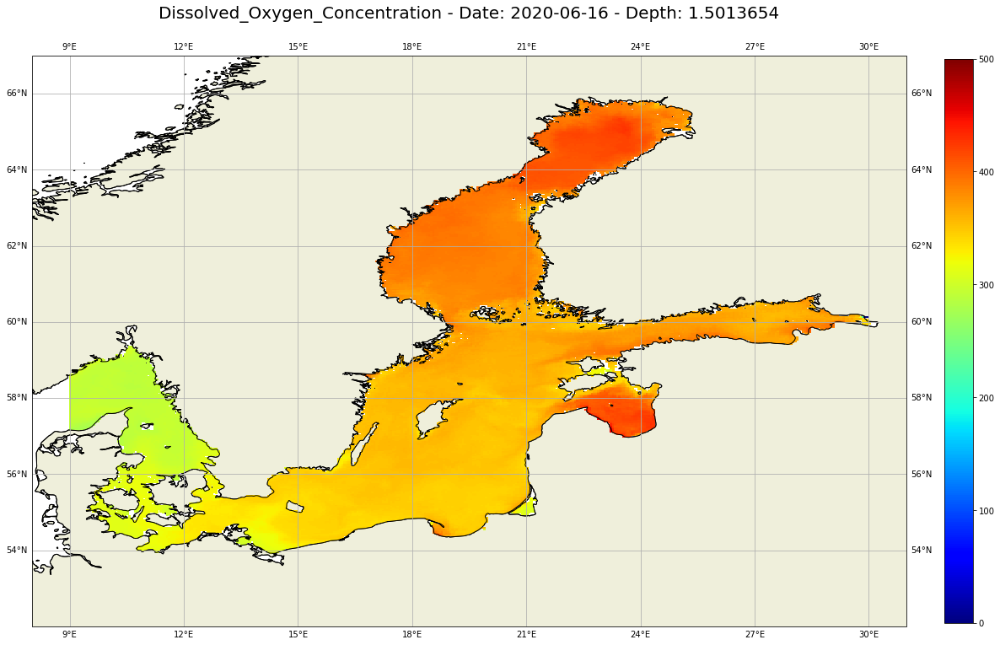

In [21]:
# Call the Funktion disso2_map with a date
diso2_map('2020-06-16', depth_min_o2, 'maps/o2_maps' )

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Call the funktion disso2_map with another date.
</div> 

## <a id='diss_oxy_sdate'></a>3.2 Dissolved Oxygen of the Baltic Sea for a serie of dates
[Go back to the "Table of contents"](#content)

In this section we are plotting maps of a serie of dates of the **Dissolved Oxygen**.  
We are selecting every second month of the year 2020.

In [22]:
# Length of the date array of the o2-data
time_len_o2 = len(data_baltic_o2.time)
time_len_o2

60

In [23]:
# Variable for the list of the selected dates
Date_list_o2 = []

# 1. Parameter : First Index of interested date. We start with the index 48, that is the date 16.01.2020
# 2. Parameter : length of the date array
# 3. Parameter: intervall of interested dates. We choose index steps 2.
# The selected dates with the indices are printed

for i in range(48, time_len_o2, 2):
    print(i)
    dt = data_baltic_o2.time[i].values
    dt_str = str(dt)[:10]
    print(dt_str)
    Date_list_o2.append(dt_str)

print(Date_list_o2)
len(Date_list_o2)

48
2020-01-16
50
2020-03-16
52
2020-05-16
54
2020-07-16
56
2020-09-16
58
2020-11-16
['2020-01-16', '2020-03-16', '2020-05-16', '2020-07-16', '2020-09-16', '2020-11-16']


6

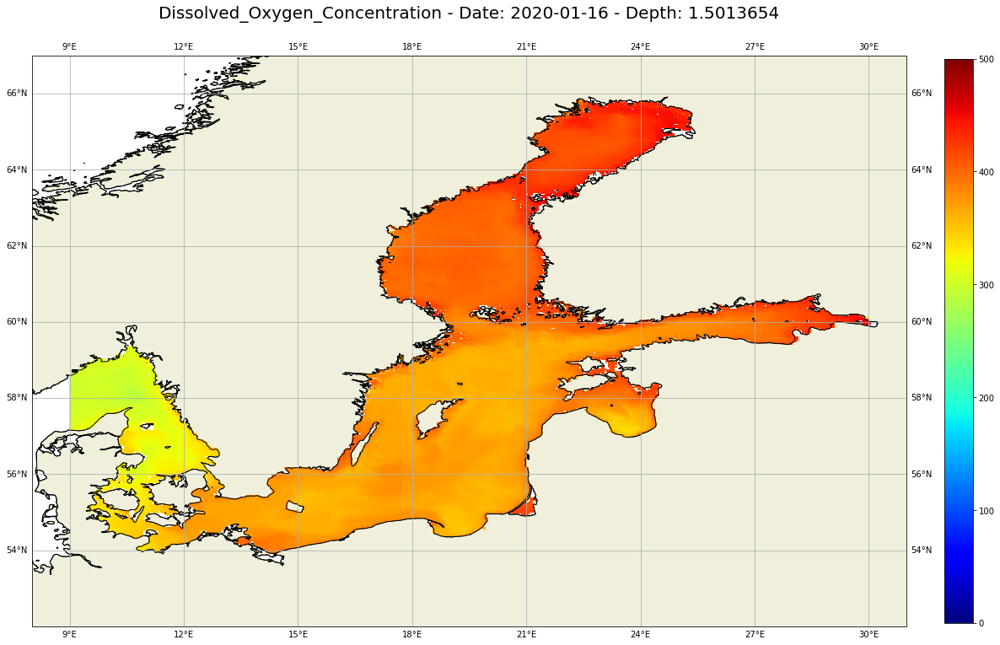

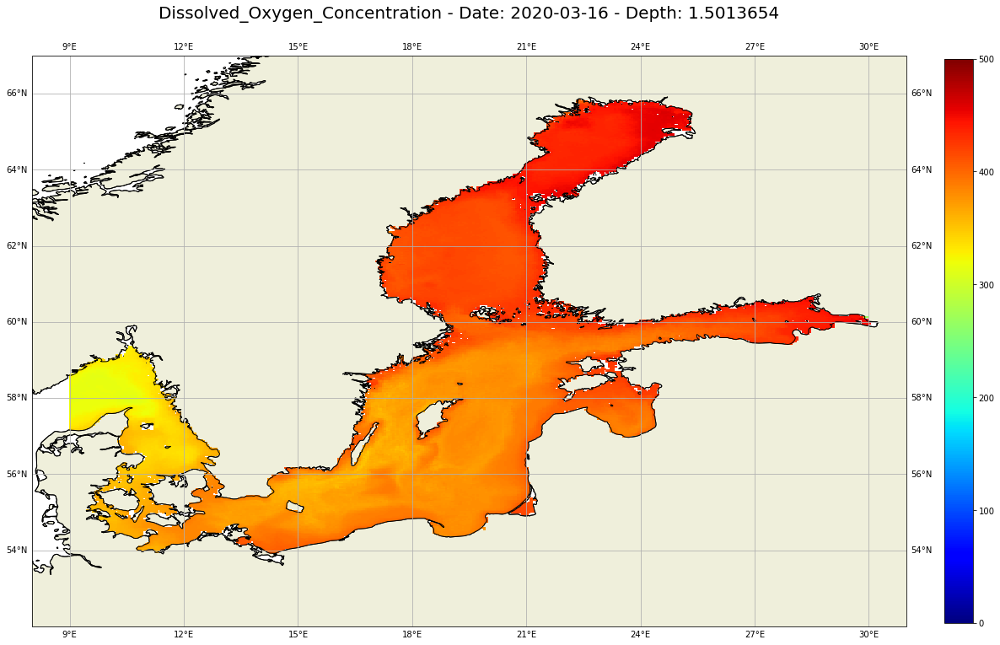

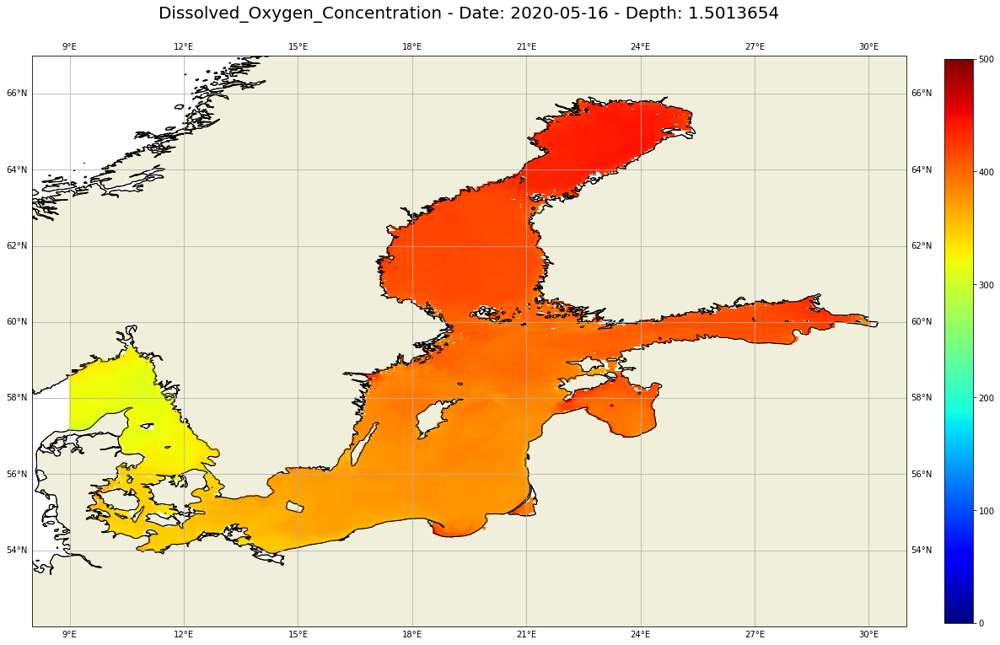

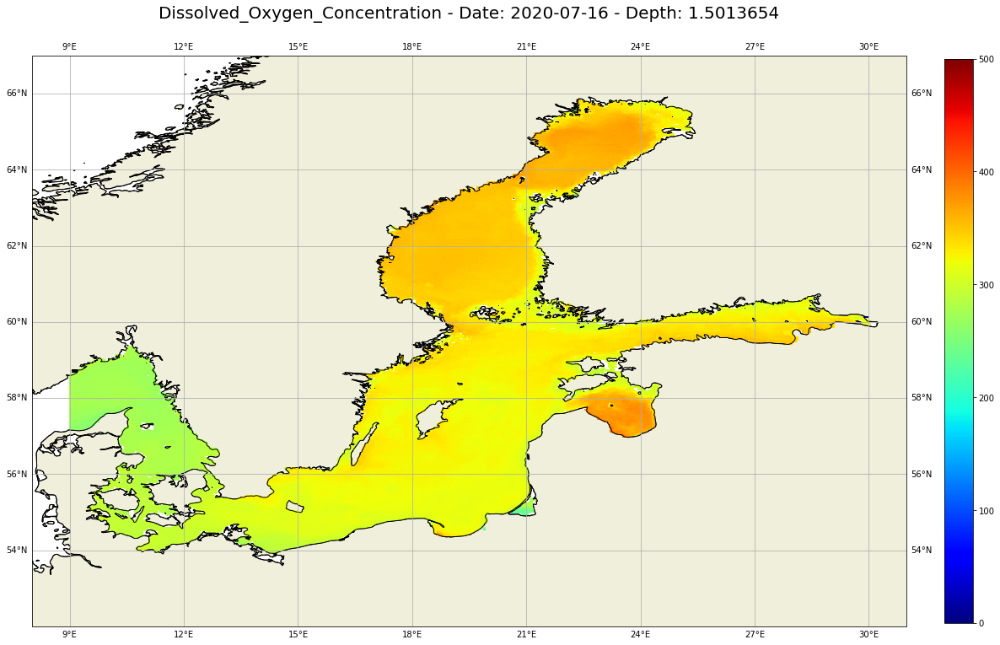

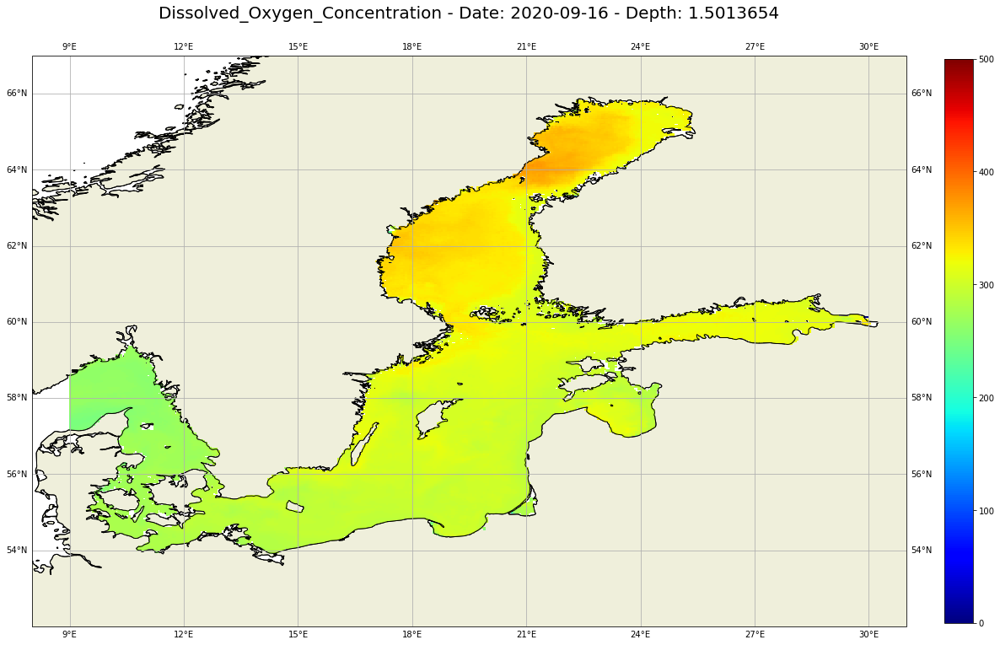

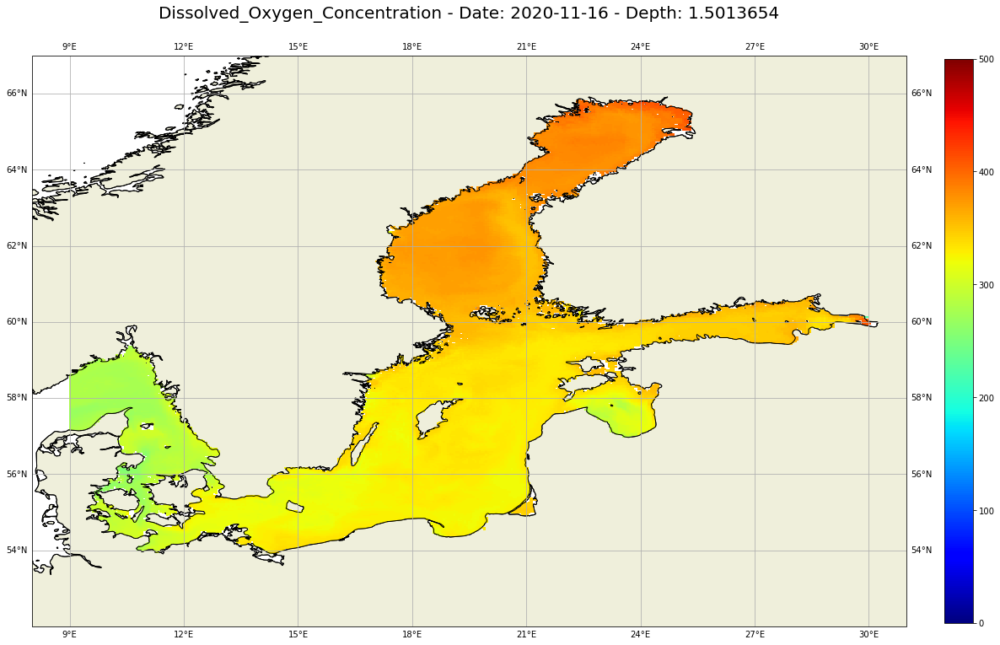

In [24]:
# Now we are generating the maps for Date_list_o2 and save the maps in the directory maps/o2_maps/date

for date in Date_list_o2 :
   diso2_map(date, depth_min_o2, 'maps/o2_maps/date')

These maps are now shown in an animated slide show.

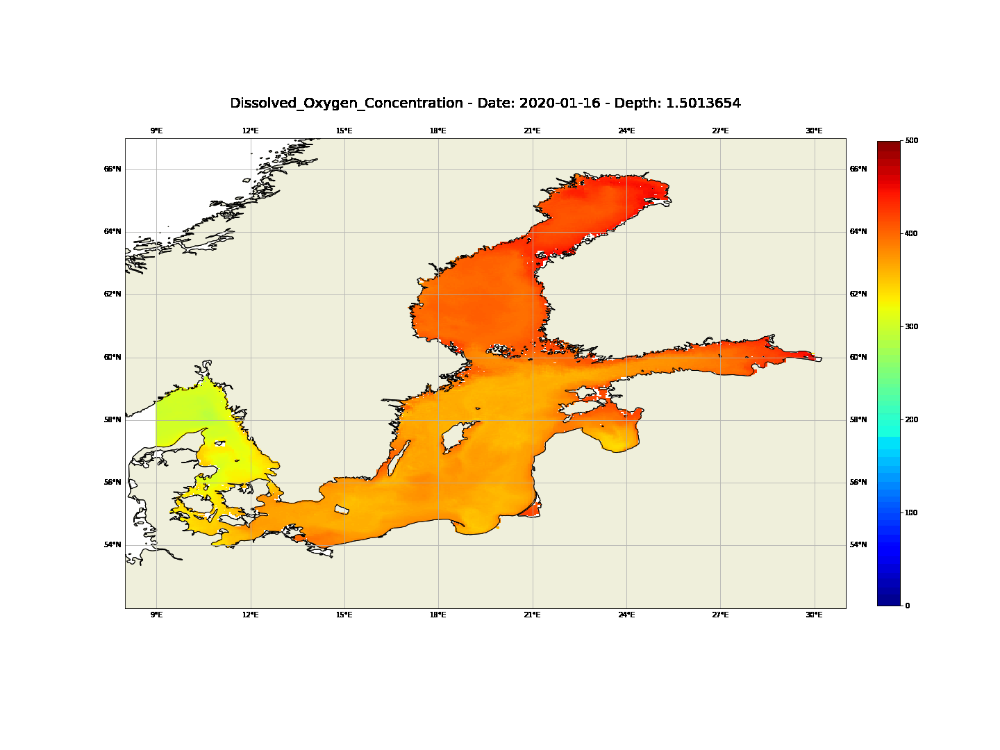

In [25]:
# Import the modules for the animation

import imageio
from pathlib import Path
from IPython.display import Image

# Search the maps
image_path = Path('maps/o2_maps/date')
images = sorted(image_path.glob('o2_map_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))
    
    
# Save the animated gif-file with 2 loops
imageio.mimwrite('maps/o2_maps/date/o2_map.gif',image_list,duration=2.5,loop=1)

# Show the animated gif-file
with open('maps/o2_maps/date/o2_map.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Delete the maps in maps/o2_maps/date/. <br>
Change the date list. For example choose every april and october of the years 2016-2020.  <br>
Plot the animated maps.
</div> 

## <a id='diss_oxy_sdepth'></a>3.3 Dissolved Oxygen of the Baltic Sea for a serie of depths
[Go back to the "Table of contents"](#content)

In this section we are plotting maps of the **Dissolved Oxygen** for a serie of depths.

In [26]:
# We ar selecting the depth array of the o2 dataset and print the length
depth_o2 = data_baltic_o2.depth
depth_o2
depth_len_o2 = len(depth_o2.depth)
depth_len_o2

21

In [27]:
# At least 4 depths are needed, because in a following section we want to print 4 suplots
# Variable for the list of the selected depths

depth_list = []

# 1. Parameter : First Index of interested depth. We start with the index 0.
# 2. Parameter : length of o2 depth array
# 3. Parameter: intervall of interested depths. We choose index steps 4.
# The selected depths with the indices are printed.

for i in range(0, depth_len_o2, 4):
    print(i)
    dv = depth_o2.depth.values[i]
    print(dv)
    depth_list.append(dv)

print(depth_list)

0
1.5013654
4
13.652688
8
26.287226
12
40.070496
16
56.50011
20
78.612465
[1.5013654, 13.652688, 26.287226, 40.070496, 56.50011, 78.612465]


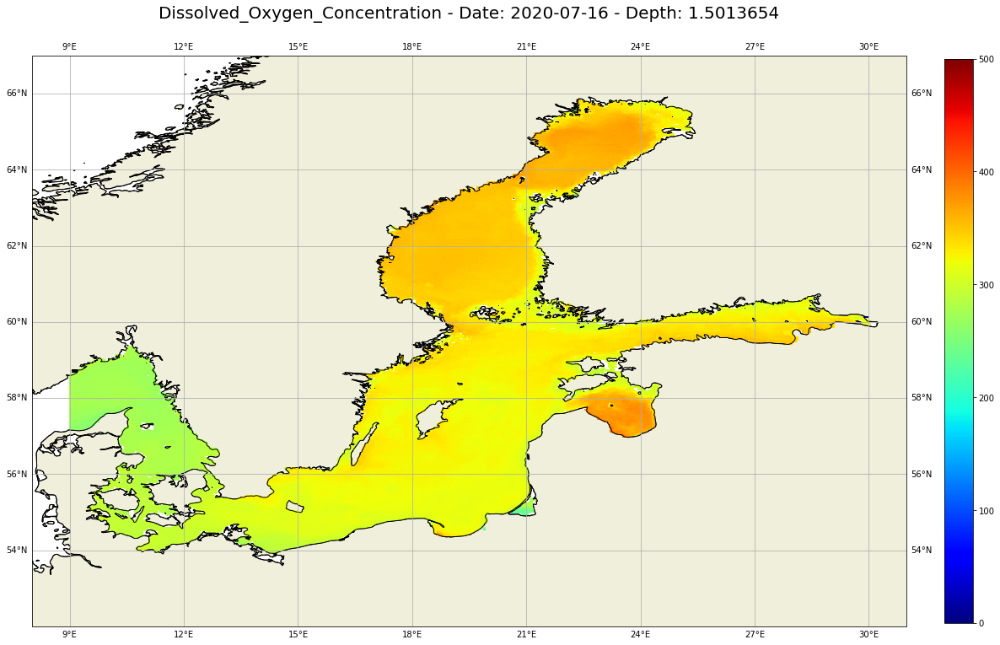

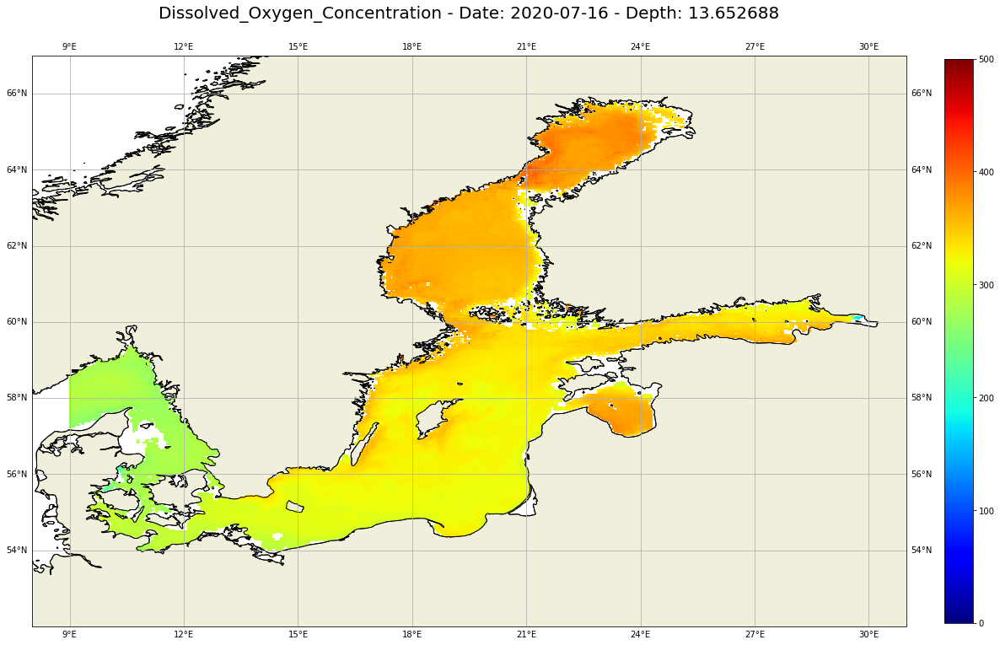

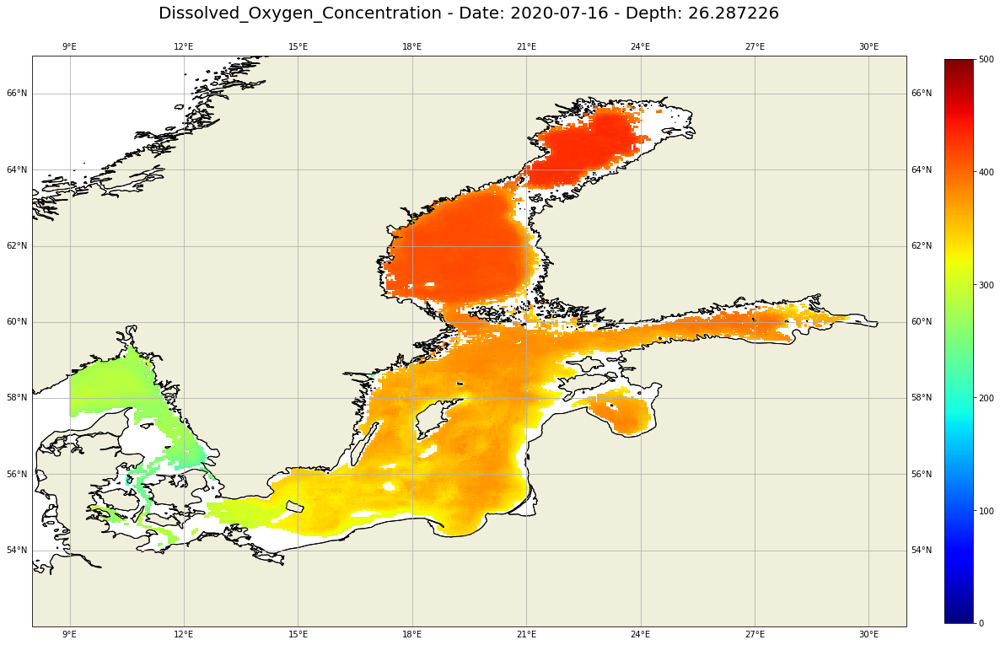

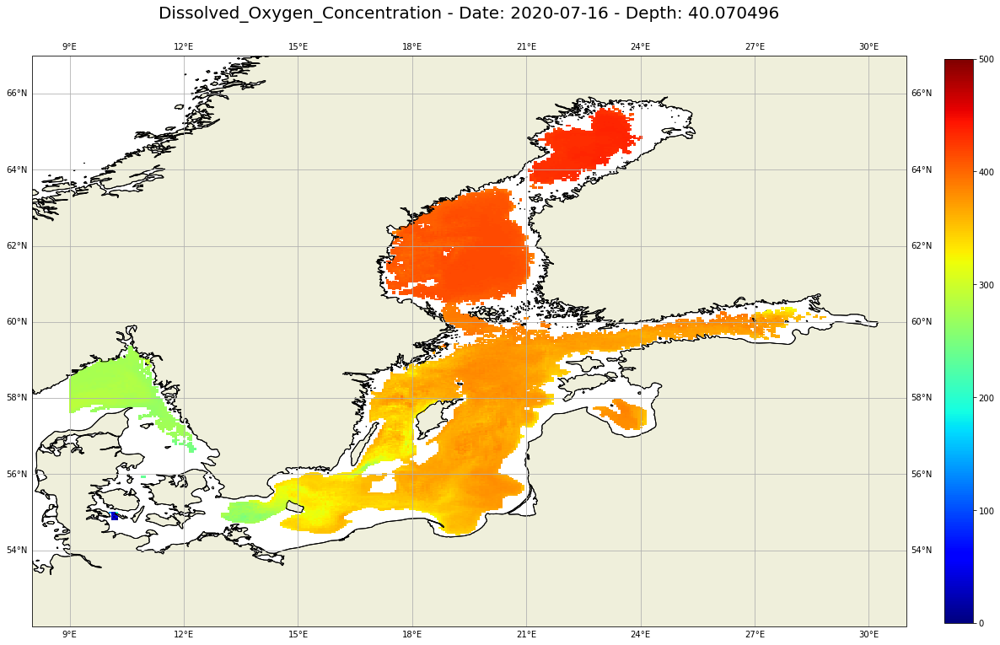

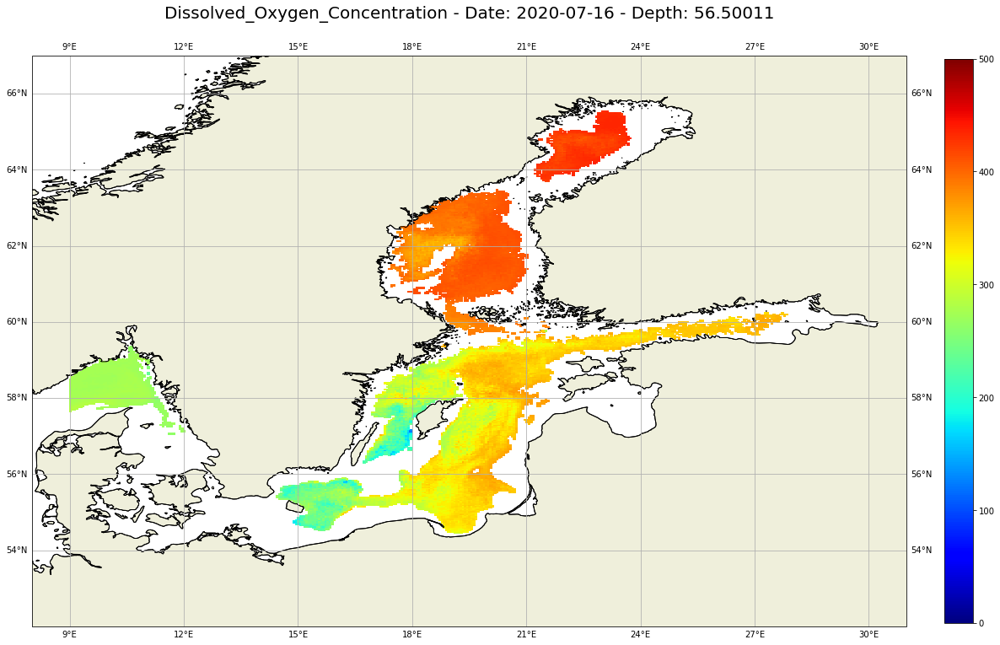

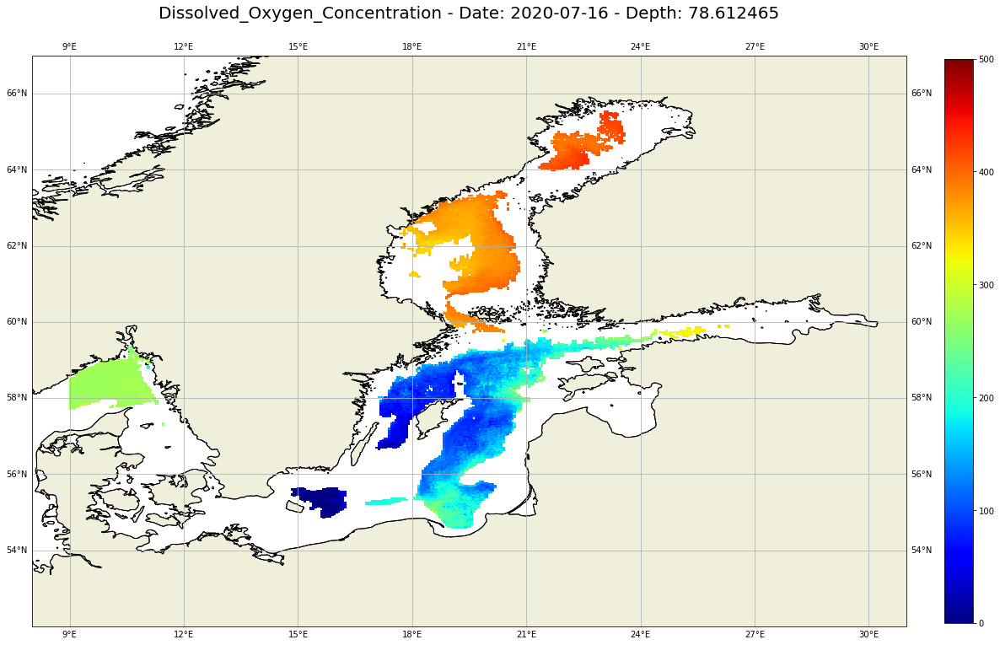

In [28]:
# We choose the date 16.07.2020
# Loop over the depth_list
# The maps are saved in maps/o2_maps/depth

for i in depth_list :
    diso2_map('2020-07-16', i, 'maps/o2_maps/depth')

These maps are now shown in an animated slide show.

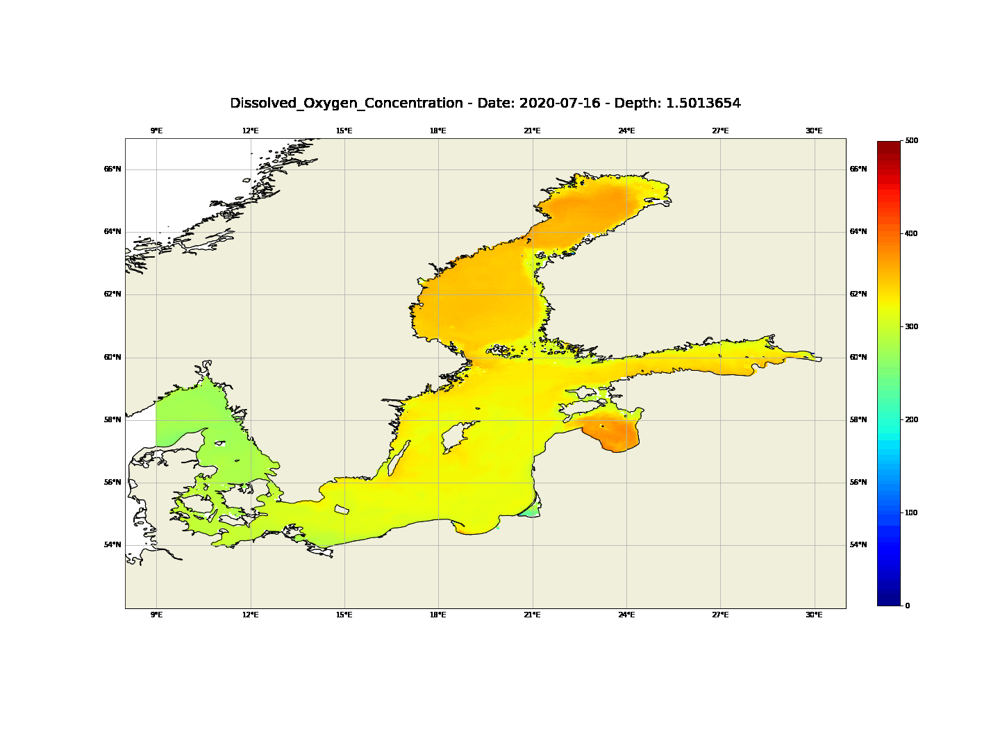

In [29]:
# Import the modules for the animation

import imageio
from pathlib import Path

# Search the maps
image_path = Path('maps/o2_maps/depth')
images = sorted(image_path.glob('o2_map_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))
    
    
# Save the animated gif-file
imageio.mimwrite('maps/o2_maps/depth/o2_map.gif',image_list,duration=2.5,loop=1)

# Show the animated gif-file
with open('maps/o2_maps/depth/o2_map.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Delete the maps in maps/o2_maps/depth/. <br>
Choose other dates, for example 16.04.2020 and 16.09.2020.  <br>
Plot the animated maps.
</div> 

## <a id='chloro'></a>4. Chlorophyll
[Go back to the "Table of contents"](#content)

In this section we explore the **Chlorophyll a concentration** of the Baltic Sea.  
We are plotting the Chlorophyll for one date and for a serie of dates.

## <a id='chloro_date'></a>4.1 Chlorophyll of the Baltic Sea for one date

In [45]:
# Definition of a Function

# We are defining a function for plotting a map of Chlorophyll at the minimum depth
# Input parameter: date, map_dir (directory to save the map), long_lat_in (longitude and latitude)

def chl_map(date, map_dir, long_lat_in):

    # Select the chl-data with the input parameter date
    chl_map = chl_data['chl'].sel(time=date, method = 'nearest').squeeze()

    # Define the settings of the plot
    f = plt.figure(figsize=(20, 15))                                                   # define the size of the plot
    ax = plt.axes(projection=ccrs.PlateCarree())                                       # create an ax and select the projection
    ax.coastlines()                                                                    # add coastlines
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                        # add map gridlines
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')                             # add land mask
    ax.set_extent(long_lat_in,crs=ccrs.PlateCarree())                                  # define the extent of the map (we defined above long_lat (the longitude-latitude-window))
    
    # Plot the chl-data, set the minimum and maximum values of the colorbar and the colormap to use
    im = ax.pcolor(chl_map['longitude'].data, chl_map['latitude'].data,chl_map,vmin=0,vmax=1.2,cmap='viridis')
   
    # Add a title
    Title = chl_name + '  {}'.format(date)
    plt.title(Title, fontsize=20)

    # Add color scale
    f.colorbar(im,ax=ax,fraction=0.03, pad=0.04)
    
    # Save the figure in the directory map_dir
    plt.savefig(map_dir + '/chl_map_' + date)


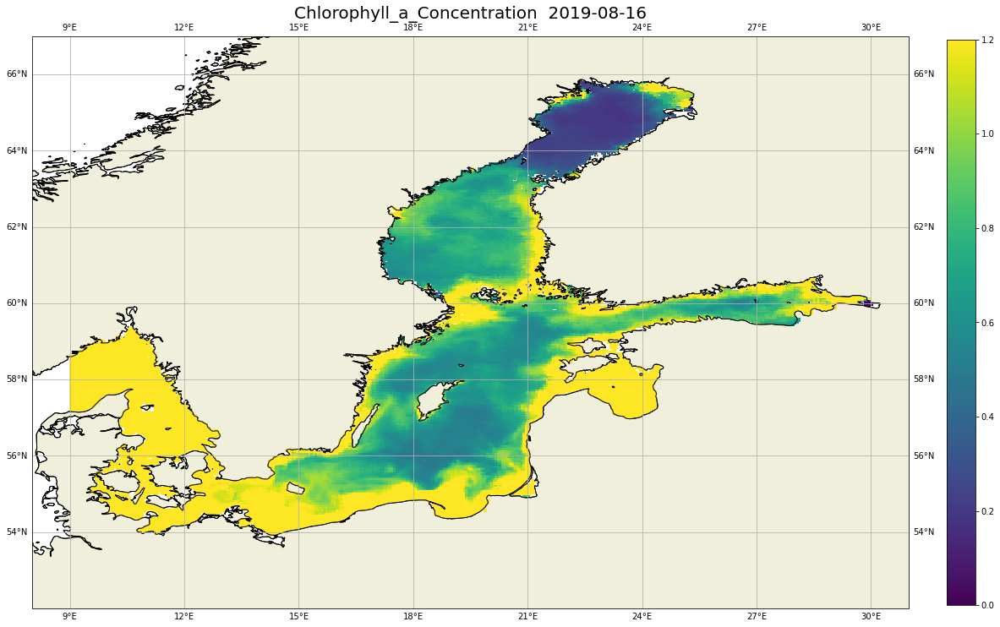

In [46]:
# Call the Funktion chl_map with a date
chl_map('2019-08-16', 'maps/chl_maps', long_lat )

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Call the funktion chl_map with another date.
</div> 

## <a id='chloro_sdate'></a>4.2 Chlorophyll of the Baltic Sea for a serie of dates
[Go back to the "Table of contents"](#content)

In this section we are plotting maps of a serie of dates of **Chlorophyll**.
We are selecting every second month of the year 2020.

In [32]:
# Length of the date array of the chl-data
time_len_chl = len(chl_data.time)
time_len_chl

60

In [33]:
# Variable for the list of the selected dates
Date_list = []

# 1. Parameter : First Index of interested date. We start with the index 48, that is the date 16.01.2020
# 2. Parameter : length of the date array
# 3. Parameter: intervall of interested dates. We choose index steps 2.
# The selected dates with the indices are printed

for i in range(48, time_len_chl, 2):
    # print(i)
    dt = chl_data.time[i].values
    dt_str = str(dt)[:10]
    print(dt_str)
    Date_list.append(dt_str)

print(Date_list)
len(Date_list)

2020-01-16
2020-03-16
2020-05-16
2020-07-16
2020-09-16
2020-11-16
['2020-01-16', '2020-03-16', '2020-05-16', '2020-07-16', '2020-09-16', '2020-11-16']


6

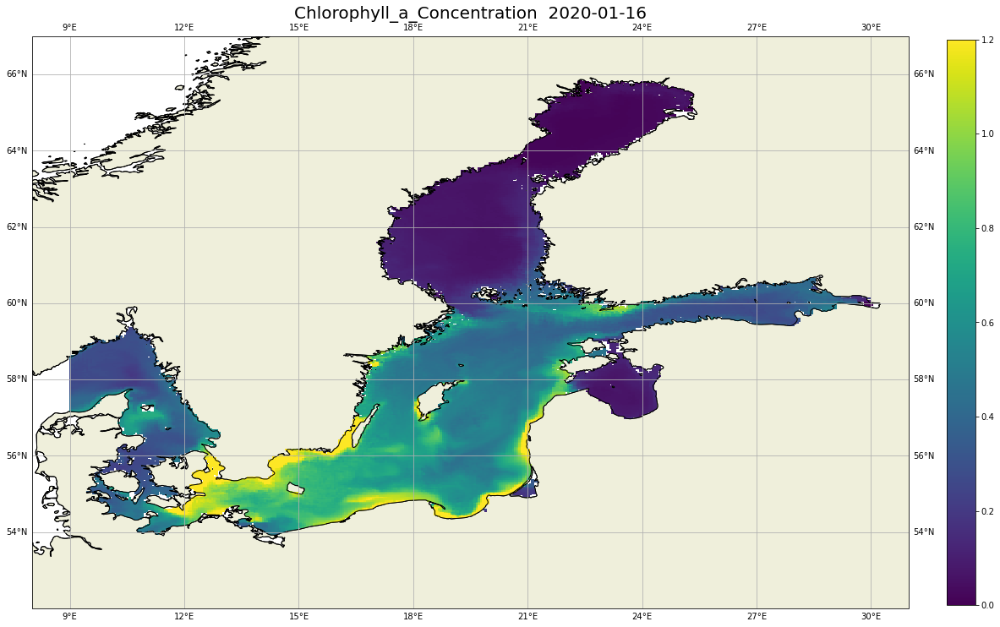

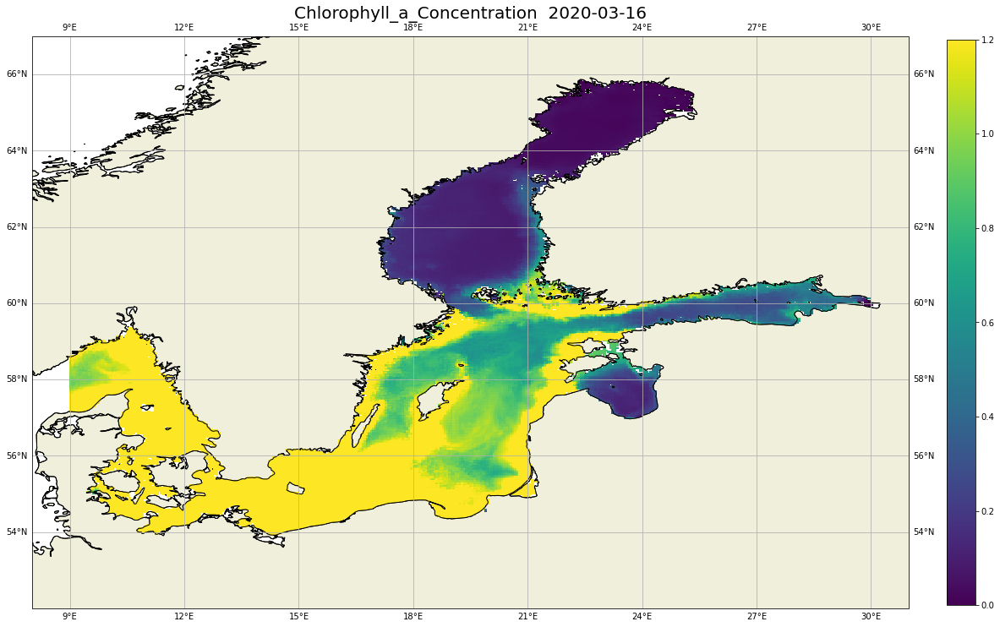

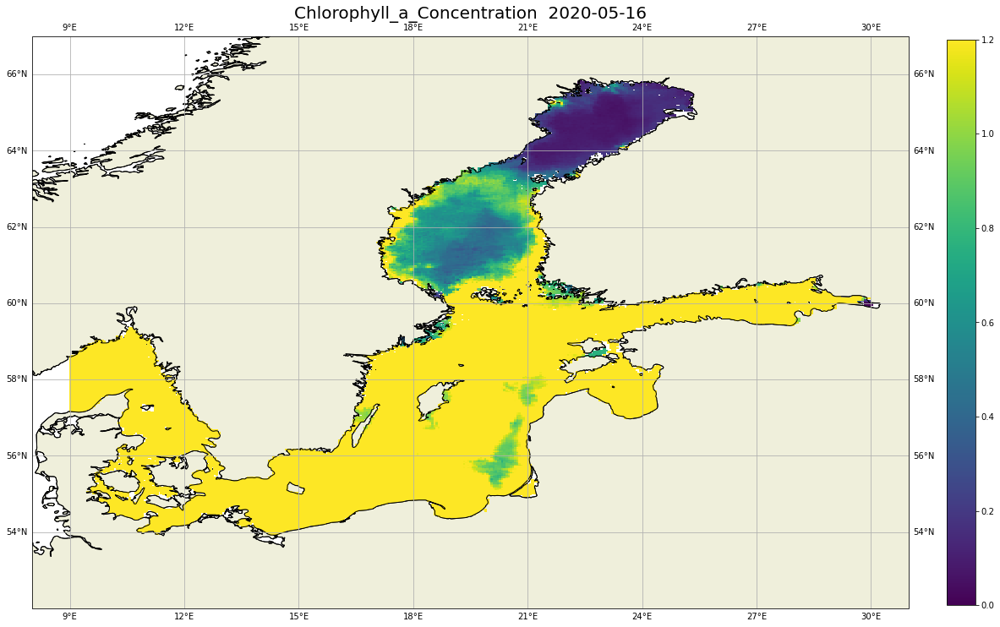

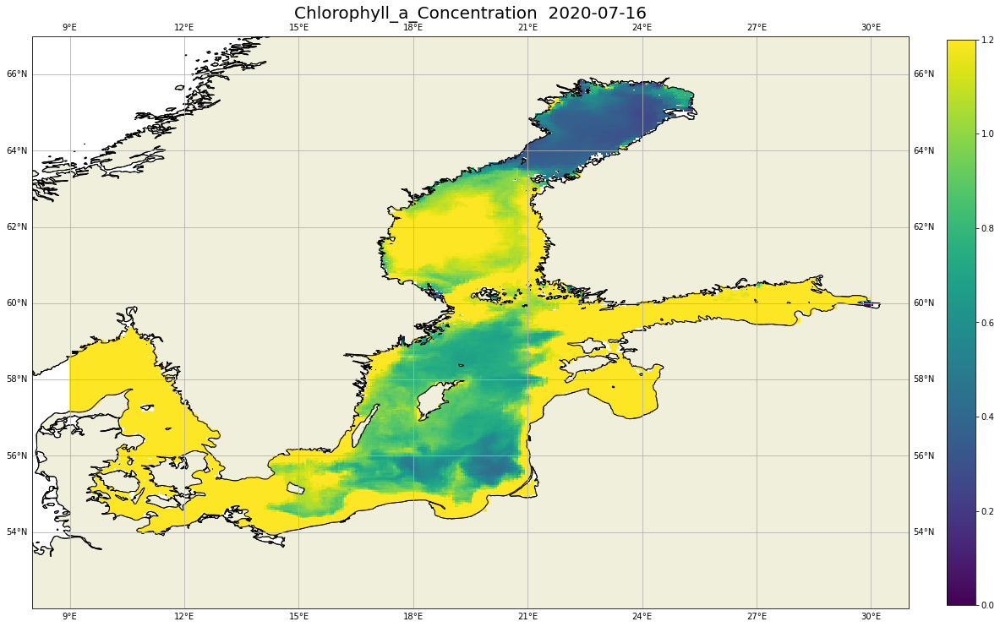

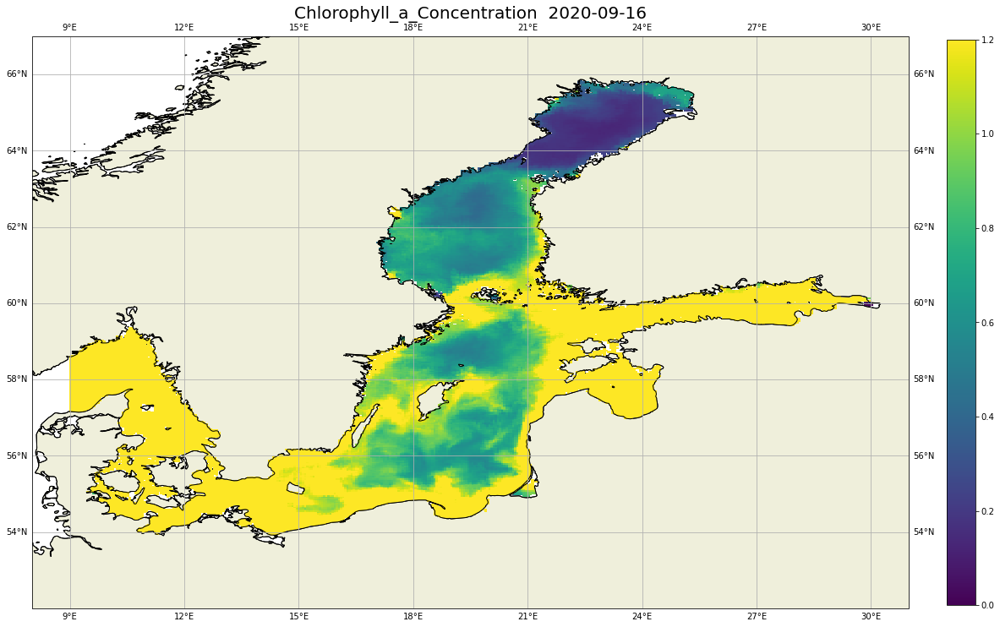

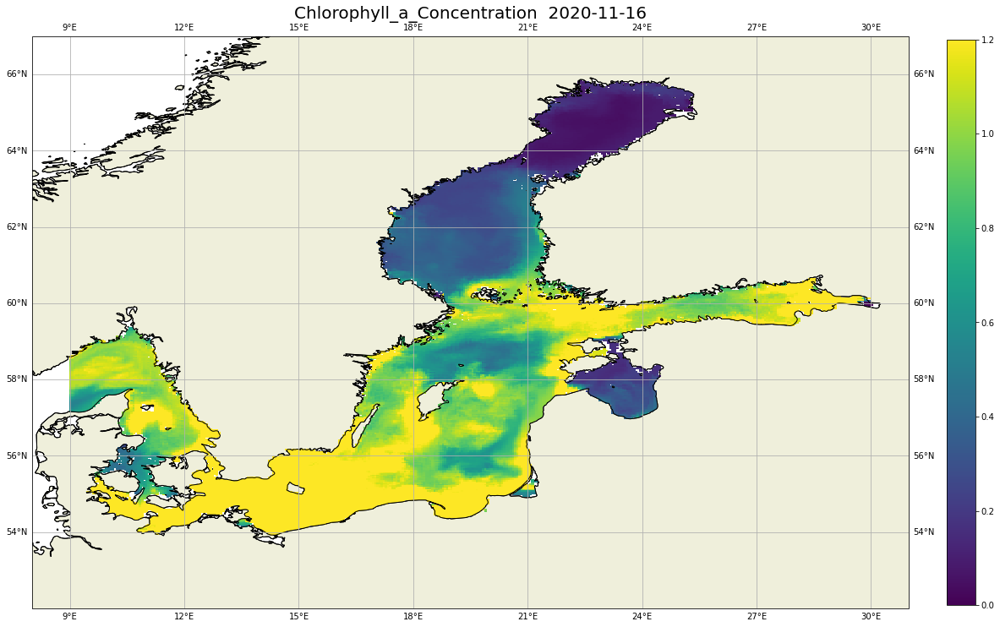

In [34]:
# Now we are generating the maps for the Date_list

for date in Date_list :
    chl_map(date, 'maps/chl_maps/date' )

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Delete the maps in maps/chl_maps/date/. <br>
Change the date list. For example choose every april and october of the years 2016-2020.  <br>
Plot the maps.
</div> 

## <a id='oxy_chl_rel'></a>5. Chlorophyll-Oxygen-Relation at the coast from the Bay of Kiel to the Bay of Pomeranian
[Go back to the "Table of contents"](#content)

Now we zoom on the coast of the Baltic Sea from the Bay of Kiel to the Bay of Pomeranian:


<center>
    <img src="img/Ostsee_zoom.png" width="300">
</center>

We are plotting maps to show the relation between the **Chlorophyll a** and the **Dissolved Oxygen** in a serie of depths.

In [35]:
# The longitude and latitude of the region to explore.
long_lat_reg = [8, 15, 53, 56]

In [36]:
# Show the depth_list
depth_list

[1.5013654, 13.652688, 26.287226, 40.070496, 56.50011, 78.612465]

In [37]:
# Definition of a Function

# This function is generating 4 suplots of Dissolved Oxygen on the first 4 depths selected above in the variable depth_list.
# The parameter is a date.

def o2_4subp(date):

    # Generating 4 subplots
    f, axs = plt.subplots(2, 2, figsize = (25,15), subplot_kw=dict(projection=ccrs.PlateCarree()))

    # First depth
    # Select the o2-data of the first depth and the date
    data_o2_depth = data_baltic_o2.sel(depth=depth_list[0], method='nearest')    
    o2_map = data_o2_depth['o2'].sel(time=date, method = 'nearest').squeeze()

    # Define the settings of the first subplot
    axs[0,0].coastlines()                                                              # add coastlines
    gl = axs[0,0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                  # add map gridlines
    gl.right_labels = False                                                            # remove labels on the right
    gl.top_labels = False                                                              # remove labels on the top
    axs[0,0].add_feature(cfeature.LAND, zorder=1, edgecolor='k')                       # add land mask
    axs[0,0].set_extent(long_lat_reg,crs=ccrs.PlateCarree())                           # define the extent of the map we defined above long_lat_reg (the longitude-latitude-window)

    # Plot the o2-data, set the minimum and maximum values of the colorbar and the colormap to use
    im1 = axs[0,0].pcolor(o2_map['longitude'].data, o2_map['latitude'].data,o2_map,vmin=0,vmax=500,cmap='jet')

    # Add color scale
    f.colorbar(im1,ax=axs[0,0],fraction=0.02, pad=0.04)
    
    # Add a title
    axs[0,0].set_title( 'o2 - Date: {}'.format(date) + ' - Depth: ' + str(depth_list[0]),fontsize=20)


    # Second depth
    # Select the o2-data of the second depth and the date
    data_o2_depth = data_baltic_o2.sel(depth=depth_list[1], method='nearest')
    o2_map = data_o2_depth['o2'].sel(time=date, method = 'nearest').squeeze()

    # Define the settings of the second subplot
    axs[0,1].coastlines()                                                              # add coastlines
    gl2 = axs[0,1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                 # add map gridlines
    gl2.right_labels = False                                                           # remove labels on the right
    gl2.top_labels = False                                                             # remove labels on the top
    axs[0,1].add_feature(cfeature.LAND, zorder=1, edgecolor='k')                       # add land mask
    axs[0,1].set_extent(long_lat_reg,crs=ccrs.PlateCarree())                           # define the extent of the map (we defined above long_lat_reg (the longitude-latitude-window))

    # Plot the o2-data, set the minimum and maximum values of the colorbar and the colormap to use
    im2 = axs[0,1].pcolor(o2_map['longitude'].data, o2_map['latitude'].data,o2_map,vmin=0,vmax=500,cmap='jet')

    # Add color scale
    f.colorbar(im2,ax=axs[0,1],fraction=0.02, pad=0.04)

    # Add a title
    axs[0,1].set_title( 'o2 - Date: {}'.format(date) + ' - Depth: ' + str(depth_list[1]),fontsize=20)

    
    # Third depth
    # Select the o2-data of the third depth and the date
    data_o2_depth = data_baltic_o2.sel(depth=depth_list[2], method='nearest')
    o2_map = data_o2_depth['o2'].sel(time=date, method = 'nearest').squeeze()

    # Define the settings of the third subplot
    axs[1,0].coastlines()                                                              # add coastlines
    gl2 = axs[1,0].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                 # add map gridlines
    gl2.right_labels = False                                                           # remove labels on the right
    gl2.top_labels = False                                                             # remove labels on the top
    axs[1,0].add_feature(cfeature.LAND, zorder=1, edgecolor='k')                       # add land mask
    axs[1,0].set_extent(long_lat_reg,crs=ccrs.PlateCarree())                           # define the extent of the map (we defined above long_lat_reg (the longitude-latitude-window))

    # Plot the o2-data, set the minimum and maximum values of the colorbar and the colormap to use
    im3 = axs[1,0].pcolor(o2_map['longitude'].data, o2_map['latitude'].data,o2_map,vmin=0,vmax=500,cmap='jet')

    # Add color scale
    f.colorbar(im3,ax=axs[1,0],fraction=0.02, pad=0.04)

    # Add a title
    axs[1,0].set_title( 'o2 - Date: {}'.format(date) + ' - Depth: ' + str(depth_list[2]),fontsize=20)

    
    # Fourth depth
    # Select the o2-data of the fourth depth and the date
    data_o2_depth = data_baltic_o2.sel(depth=depth_list[3], method='nearest')
    o2_map = data_o2_depth['o2'].sel(time=date, method = 'nearest').squeeze()

     # Define the settings of the fourth subplot
    axs[1,1].coastlines()                                                              # add coastlines
    gl2 = axs[1,1].gridlines(crs=ccrs.PlateCarree(), draw_labels=True)                 # add map gridlines
    gl2.right_labels = False                                                           # remove labels on the right
    gl2.top_labels = False                                                             # remove labels on the top
    axs[1,1].add_feature(cfeature.LAND, zorder=1, edgecolor='k')                       # add land mask
    axs[1,1].set_extent(long_lat_reg,crs=ccrs.PlateCarree())                           # define the extent of the map (we defined above long_lat_reg (the longitude-latitude-window))

    # Plot the o2-data, set the minimum and maximum values of the colorbar and the colormap to use
    im4 = axs[1,1].pcolor(o2_map['longitude'].data, o2_map['latitude'].data,o2_map,vmin=0,vmax=500,cmap='jet')

    # Add color scale
    f.colorbar(im4,ax=axs[1,1],fraction=0.02, pad=0.04)

    # Add a title
    axs[1,1].set_title( 'o2 - Date: {}'.format(date) + ' - Depth: ' + str(depth_list[3]),fontsize=20)

    # Save the image of the subplots
    plt.savefig('maps/chl_o2_maps/' + '/o2_map_' + date)

    # Show the subplots
    plt.show() 

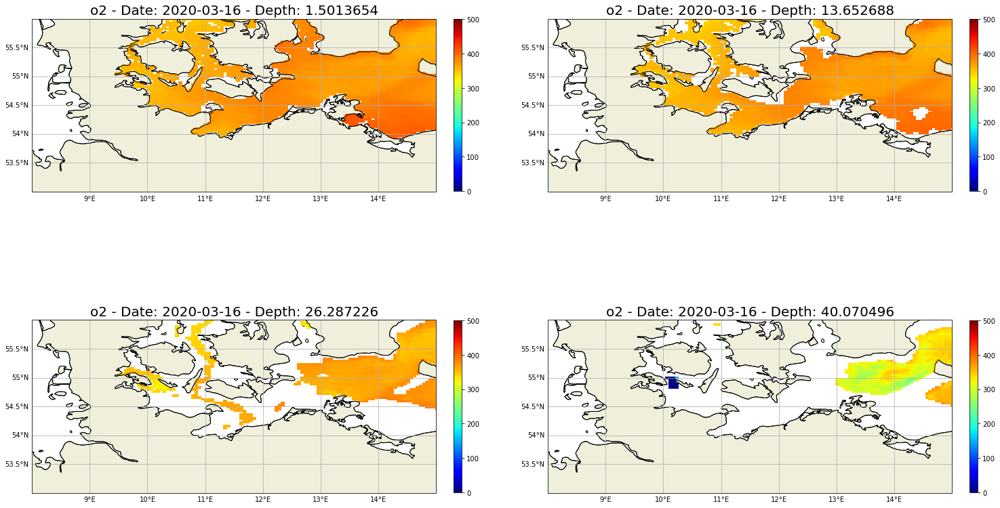

In [40]:
# Generate the supplots for the 16.07.2020
o2_4subp('2020-03-16')   

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Call the funktion o2_4subp with another date.
</div> 

In the next step the notebook is generating the relation between the **Chlorophyll** and the **Dissolved Oxygen** for 4 depths over a serie of dates.

In [41]:
# Check again the date and depth lists 
print('Date List: ', Date_list)
print('Depth List: ',depth_list)

Date List:  ['2020-01-16', '2020-03-16', '2020-05-16', '2020-07-16', '2020-09-16', '2020-11-16']
Depth List:  [1.5013654, 13.652688, 26.287226, 40.070496, 56.50011, 78.612465]


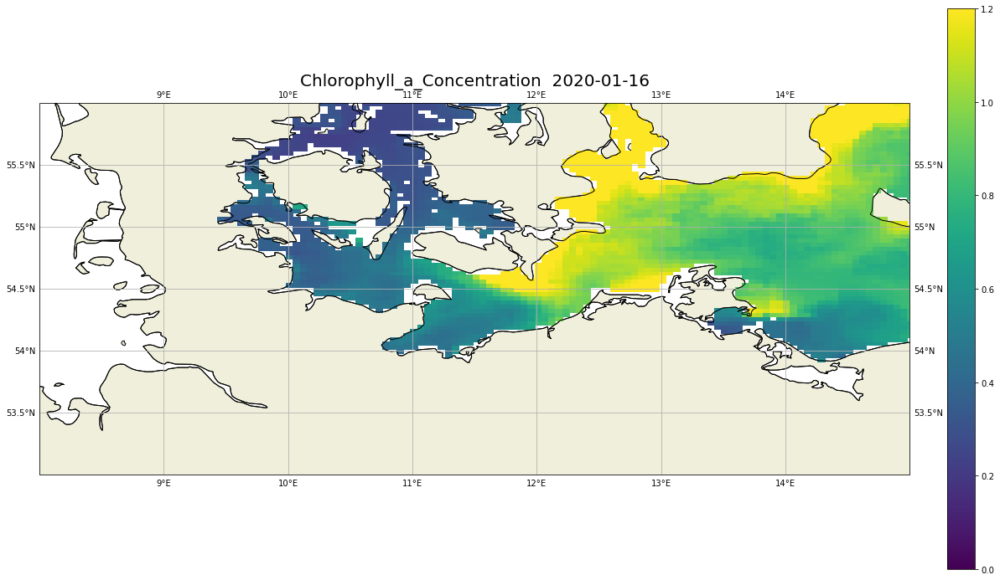

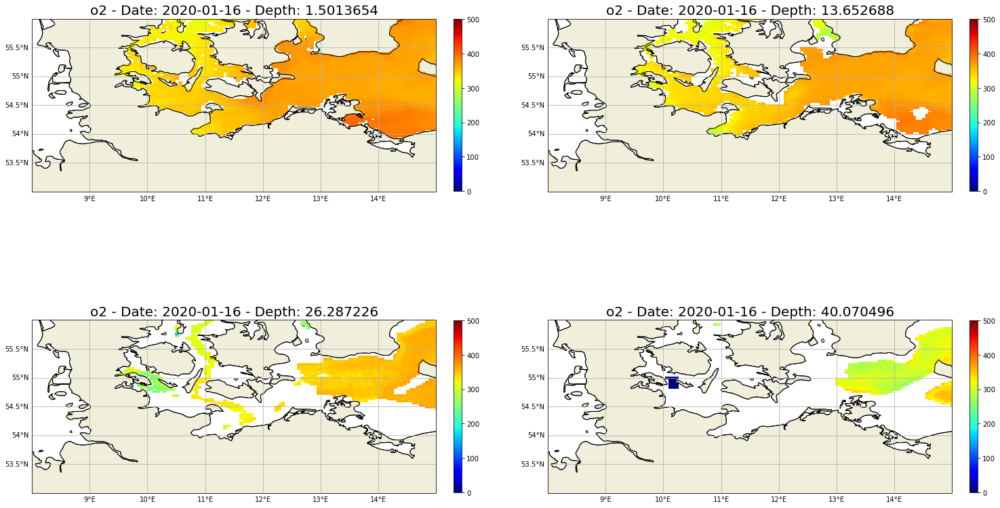

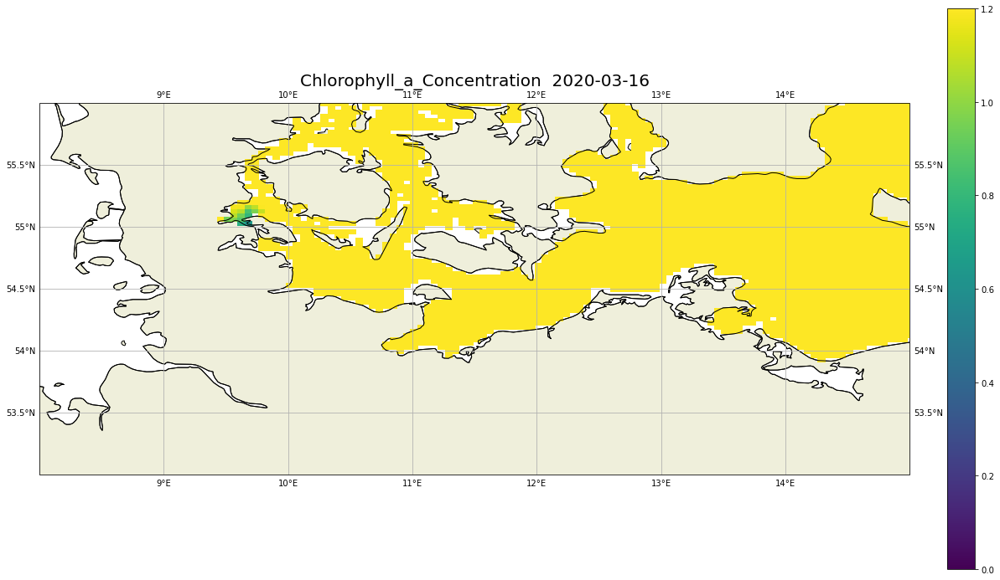

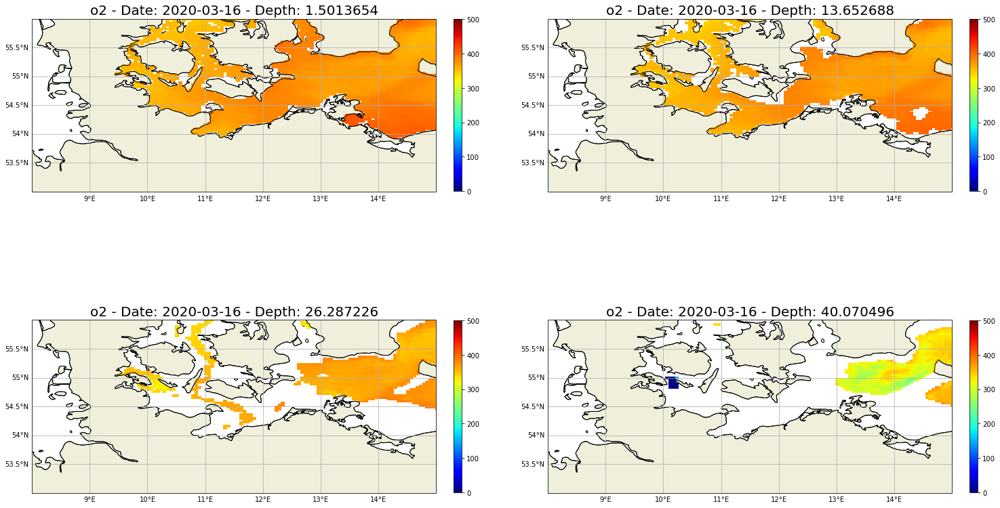

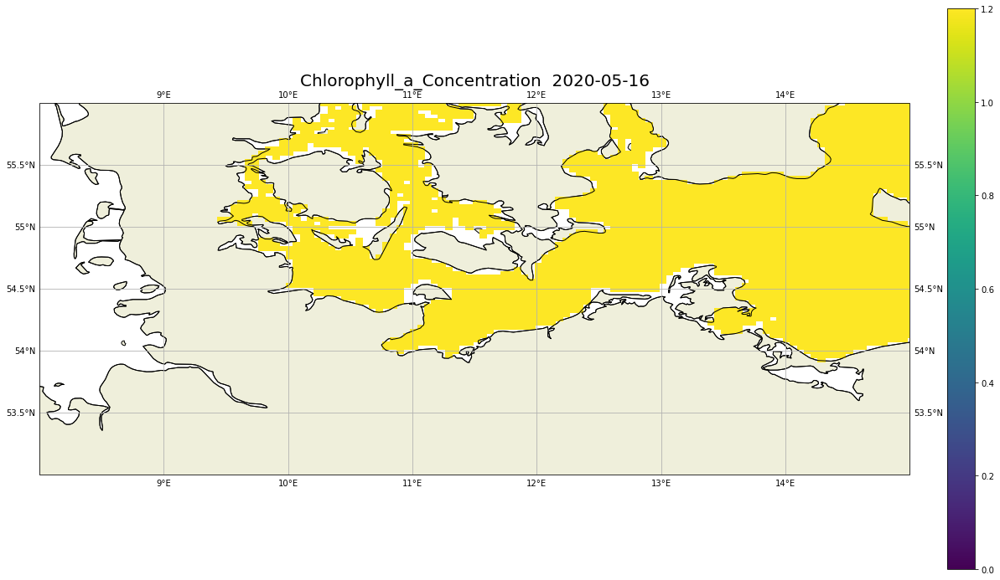

...

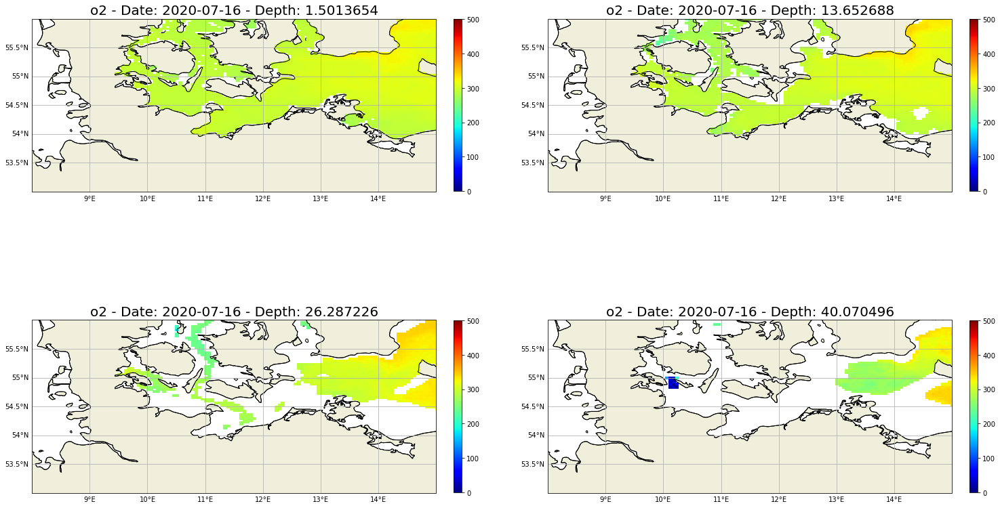

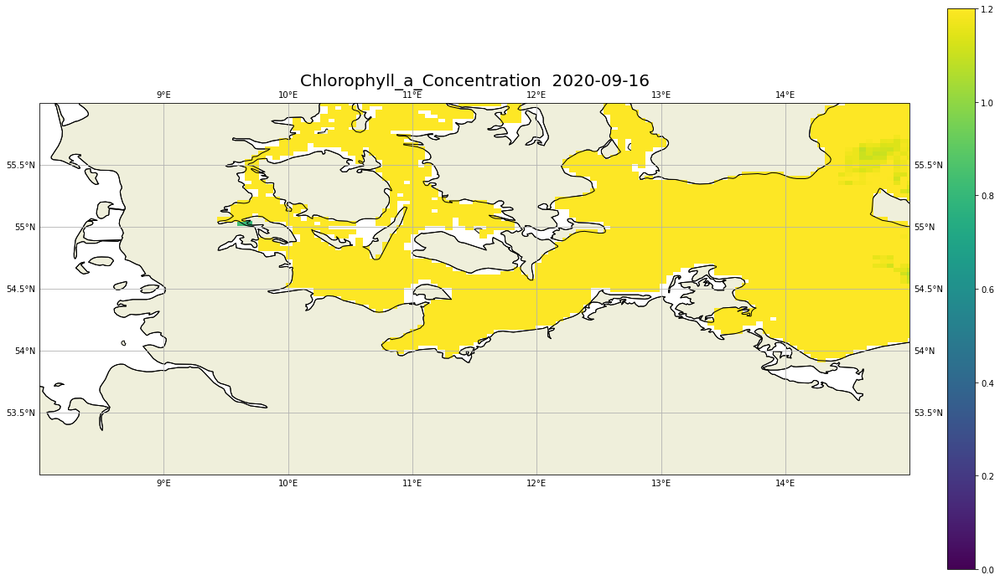

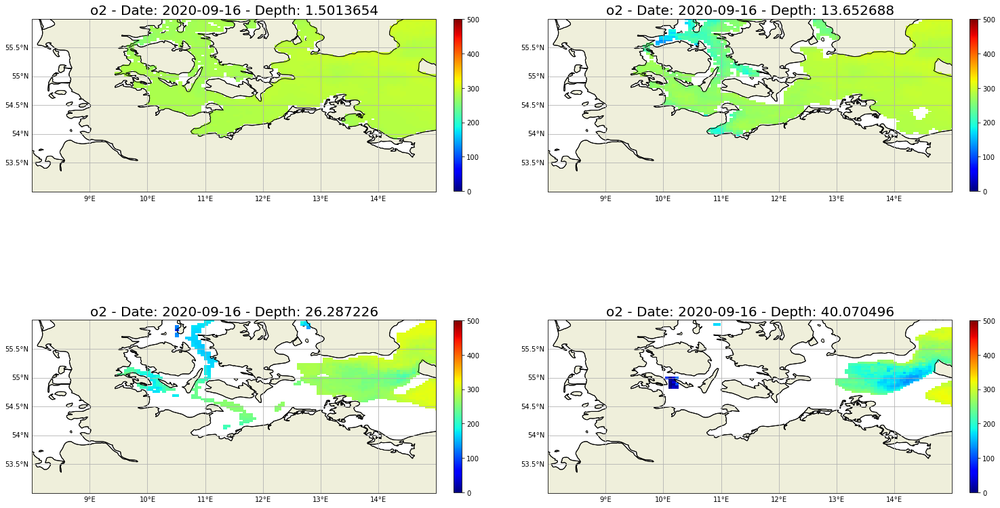

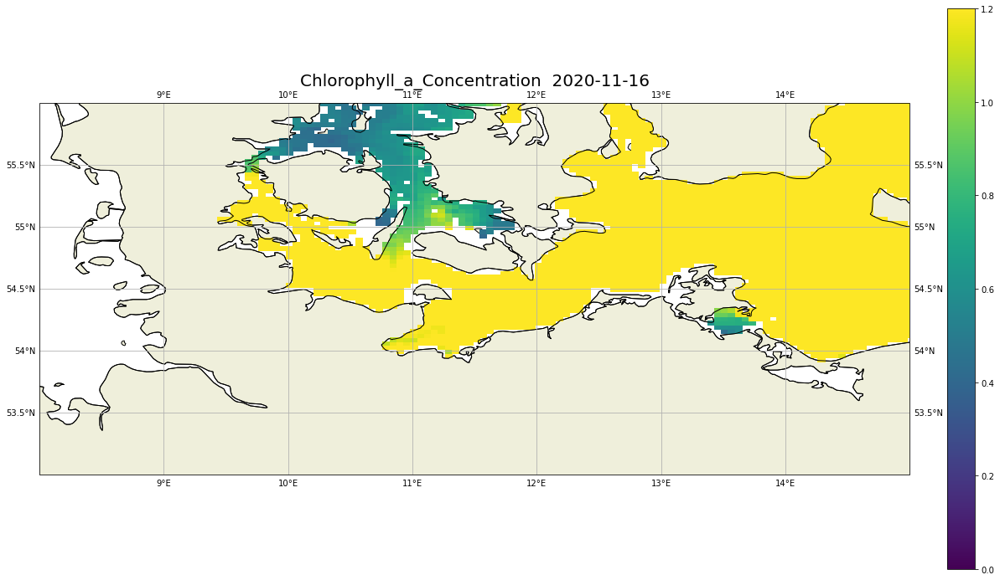

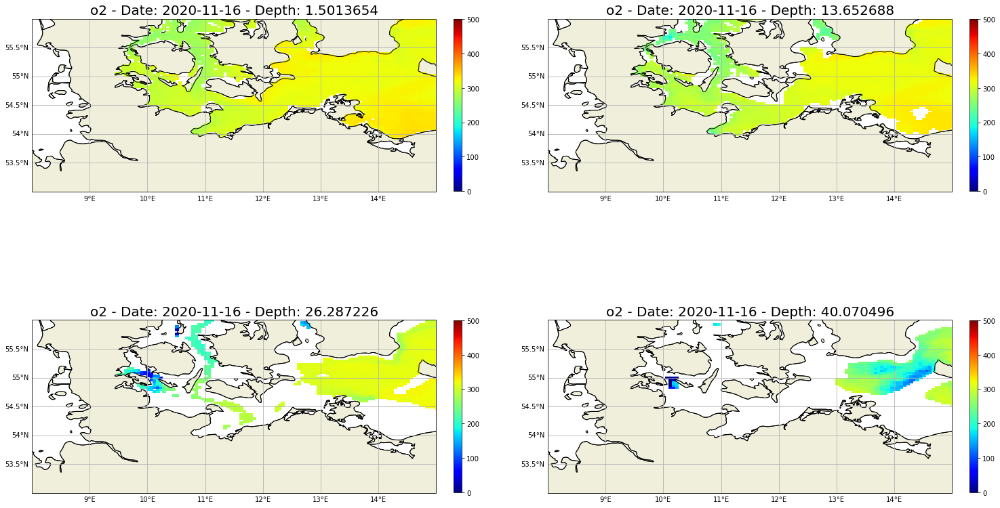

In [47]:
# Generate maps for the Chlorophyll concentration and the Oxygen concentration of the first 4 depths

for date in Date_list :
    # Call the function to generate the chl maps 
    chl_map(date, 'maps/chl_o2_maps', long_lat_reg)  
    # Call the function to generate the o2 subplots
    o2_4subp(date) 
  

<div class="alert alert-block alert-info">
<b>Exercise</b><br>
<br>
Change the date and/or depth lists and show the relation between the Chlorophyll and Oxygen concentrations.
</div> 

<div class="alert alert-block alert-success">
<b>Exercise</b><br>
<br>
Try to change the region and show and explore the Chlorophyll and oxygen concentrations.
</div> 